In [1]:
using ITensors, ITensorMPS
using SparseArrays
using LinearAlgebra
using Plots
using JLD2
using LaTeXStrings
using Glob
using StatsBase

In [2]:
using JLD2
using Glob

"""
Load sample_*.jld2 files from `outdir` and combine data across
samples and repeated jobs.

Files missing required keys (including "mode") are skipped.

Returns:
  combined :: Dict{NamedTuple, Dict{Symbol, Any}}
  skipped  :: Vector{String}
"""
function load_and_combine(outdir::String)
    files = vcat(
    glob("sample_*2025123*.jld2", outdir),
    glob("sample_*202601*.jld2", outdir),
)

    # files = glob("sample_*.jld2", outdir)

    combined = Dict{NamedTuple, Dict{Symbol, Any}}()
    skipped  = String[]

    for f in files
        d = load(f)

        # hard requirements
        if !(haskey(d, "L") &&
             haskey(d, "T") &&
             haskey(d, "p") &&
             haskey(d, "mode") &&
             haskey(d, "data"))
            push!(skipped, f)
            continue
        end

        # optional but expected
        t = get(d, "t", 1)

        key = (
            L    = d["L"],
            T    = d["T"],
            p    = d["p"],
            mode = d["mode"],
            t    = t,
        )

        if d["mode"] == "renyi2"
            println("L: ", d["L"], ", length: ", length(d["data"][:κ2_corrs]))
        end

        data = d["data"]  # Dict or NamedTuple

        if !haskey(combined, key)
            combined[key] = Dict(
                obs => deepcopy(val) for (obs, val) in pairs(data)
            )
        else
            combined[key] = Dict(
                obs => deepcopy(val) for (obs, val) in pairs(data)
            )
            # for (obs, val) in pairs(data)
            #     old = combined[key][obs]

            #     if isa(old, AbstractArray) && isa(val, AbstractArray)
            #         combined[key][obs] = vcat(old, val)
            #     else
            #         error("Cannot combine observable $obs in file $f")
            #     end
            # end
        end
    end

    return combined, skipped
end

# Example usage
outdir = joinpath(@__DIR__, "../output")
combined, skipped = load_and_combine(outdir);

# @show length(skipped)


L: 128, length: 8256
L: 128, length: 8256
L: 16, length: 136
L: 16, length: 136
L: 256, length: 32896
L: 256, length: 32896
L: 32, length: 528
L: 32, length: 528
L: 4, length: 10
L: 4, length: 10
L: 4, length: 10
L: 512, length: 131328
L: 512, length: 131328
L: 64, length: 2080
L: 64, length: 2080
L: 8, length: 36
L: 8, length: 36
L: 1024, length: 524800
L: 1024, length: 524800


(Dict{NamedTuple, Dict{Symbol, Any}}((L = 64, T = 640, p = 0.1, mode = "renyi1_sampled", t = 512) => Dict(:κ1_corrs_sampled => [0.21975572789582137 0.21644120069228895 … 0.25570757314737996 0.25609098632072513]), (L = 128, T = 1280, p = 0.1, mode = "renyi1_sampled", t = 256) => Dict(:κ1_corrs_sampled => [0.07962657661008604 0.09235502601706157 … 0.259561478753836 0.25861270663387437]), (L = 8, T = 80, p = 0.1, mode = "renyi1_TCI", t = 40) => Dict(:κ1_TCI => [1.9724856822703947], :inner_κ1_TCI => [0.8466874115468607], :κ1_corrs_TCI => [0.2612179054412324 0.2677694954953429 0.2760640148551793 0.2828889602398659]), (L = 128, T = 1280, p = 0.1, mode = "renyi1_sampled", t = 768) => Dict(:κ1_corrs_sampled => [0.17900509754540367 0.15897839910782618 … 0.249641760792082 0.25531911892081943]), (L = 4, T = 40, p = 0.1, mode = "renyi1_TCI", t = 12) => Dict(:κ1_TCI => [0.9738014302872422], :inner_κ1_TCI => [0.3157600067092599], :κ1_corrs_TCI => [0.2984849568856699 0.3157600067092599]), (L = 8, T =

In [3]:
plt = plot()

for L in [32, 64, 128, 256, 512, 1024]
    T = 10L
    ts = [80]

    for t in ts
        ind = which_ind(t)
        xs = 1:2:L
        if L == 1024
            ind += 0
        end
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

        plot!(plt, xs, ys, label="L=$L, t=$t")
    end
end
plt

UndefVarError: UndefVarError: `which_ind` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

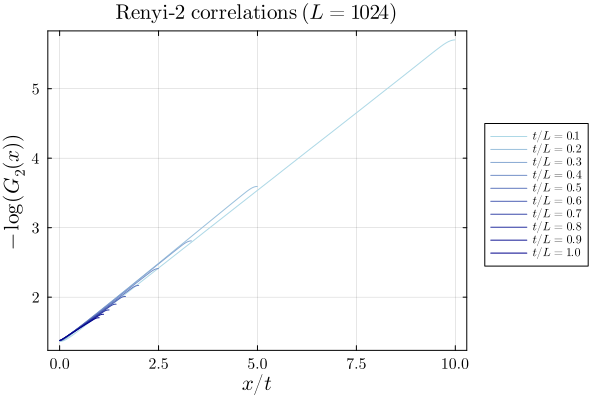

In [4]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10+1

p = 0.1

L = 1024
T = 10L

ts = union(L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)
    ys = -log.( ys)

    # ys .-= ys[1]

    plot!(plt, xs[1:end], ys[1:end], label=L"t/L=%$(round(p*t/L,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel=L"x/t", ylabel=L"-\log(G_2(x))", title=L"\textrm{Renyi‐2\ correlations\ } (L = 1024)",     tickfont=font("Computer Modern", 10),
    guidefont=font("Computer Modern"), frame=:box)#, titlefont=font("Computer Modern", 12))
# savefig(plt, "../figs/26_01_09/renyi2_correlations_L1024_rescaled.pdf")

plt

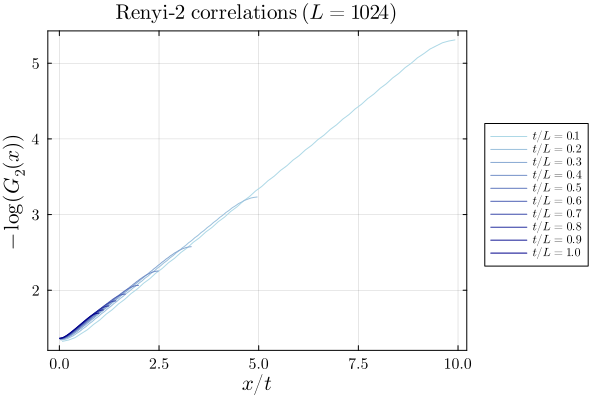

In [298]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10+1

p = 0.1

L = 128
T = 10L

ts = union(L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)
    ys = -log.( ys)

    # ys .-= ys[1]

    plot!(plt, xs[1:end], ys[1:end], label=L"t/L=%$(round(p*t/L,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel=L"x/t", ylabel=L"-\log(G_2(x))", title=L"\textrm{Renyi‐2\ correlations\ } (L = 1024)",     tickfont=font("Computer Modern", 10),
    guidefont=font("Computer Modern"), frame=:box)#, titlefont=font("Computer Modern", 12))
# savefig(plt, "../figs/26_01_09/renyi2_correlations_L1024_rescaled.pdf")

plt

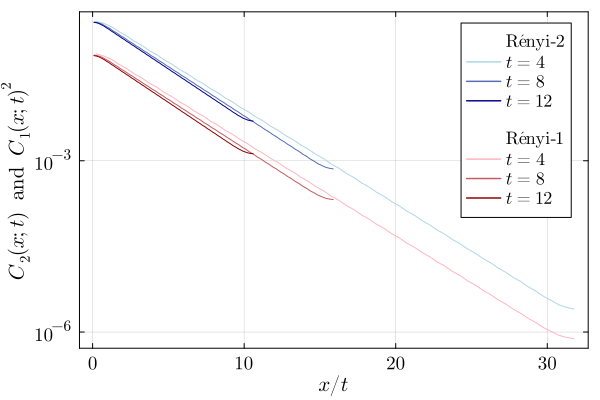

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = [40, 80, 120]
ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐2}", linealpha = 0)
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end

plot!(plt, [NaN], [NaN]; label = L" ", linealpha = 0)
plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐1}", linealpha = 0)

for (i, t) in enumerate(ts_red)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]) .^ 2
    xs /= p*t

    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_red[i], yscale=:log10)
end

plot!(plt, xlabel=L"x/t", ylabel=L"C_2(x; t)\textrm{\ \ and\ \ } C_1(x; t)^2", frame=:box, tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

# savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2.pdf")

plt


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


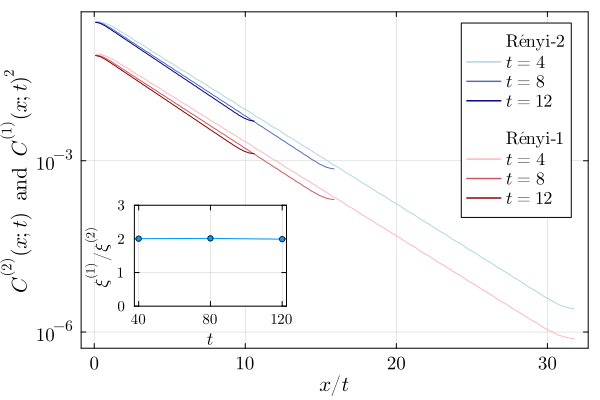

In [41]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t÷10 + 1

p = 0.1
L = 128
T = 10L

ts_blue = [40, 80, 120]
ts_red  = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red  = palette(:reds,  length(ts_red))

# inset placement (bottom-left)
BB = bbox(0.105, 0.125, 0.3, 0.3, :bottom, :left)

# main vs inset typography (matches what we've been using)
main_tickfont = font("Computer Modern", 12)
main_guide_fs = 14
main_leg_fs   = 12

inset_tickfont = font("Computer Modern", 10)
inset_guide_fs = 12

# ---------------- main plot (subplot 1) ----------------
plt = plot()

# legend headers (dummy entries) — keep your exact LaTeX
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi‐2}", linealpha=0)

for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )
end

plot!(plt, [NaN], [NaN]; subplot=1, label=L" ", linealpha=0)
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi‐1}", linealpha=0)

for (i, t) in enumerate(ts_red)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

plot!(plt;
    subplot=1,
    xlabel=L"x/t",
    ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=main_guide_fs,
    yguidefontsize=main_guide_fs,
    legendfontsize=main_leg_fs,
)

# ---------------- inset data: ξ^(1)/ξ^(2) ----------------
ts = [40, 80, 120]
ratio = zeros(length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)

    xs = collect(1:2:L) ./ (p*t)
    xs = xs[L÷8:3L÷8+1]
    X  = hcat(xs, ones(length(xs)))

    ys1 = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    ys1 = (-log.(ys1))[L÷8:3L÷8+1]
    a1, _ = (X \ ys1)

    ys2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    ys2 = (-log.(ys2))[L÷8:3L÷8+1]
    a2, _ = (X \ ys2)

    ratio[i] = a2 / a1
end

# ---------------- create inset (subplot 2) ONCE ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=inset_guide_fs,
    yguidefontsize=inset_guide_fs,
    xlabel=L"t",
    ylabel=L"\xi^{(1)}/\xi^{(2)}",
    ylim=(0, 3),
)

# draw inset points
plot!(plt, ts, ratio;
    subplot=2,
    label=false,
    marker=:circle,
    markersize=3,
    xticks=(ts, [L"%$t" for t in ts]),
    yticks=(0:1:3, [L"%$y" for y in 0:1:3]),
)

savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset.pdf")
plt


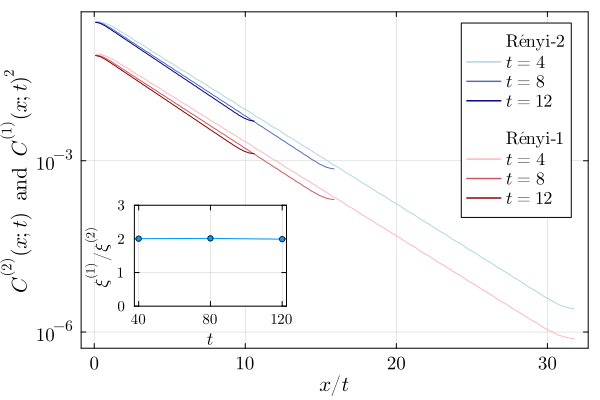

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [5]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t÷10 + 1

p = 0.1
L = 128
T = 10L

ts_blue = [40, 80, 120]
ts_red  = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red  = palette(:reds,  length(ts_red))

# inset placement (bottom-left)
BB = bbox(0.105, 0.125, 0.3, 0.3, :bottom, :left)

# main vs inset typography (matches what we've been using)
main_tickfont = font("Computer Modern", 12)
main_guide_fs = 14
main_leg_fs   = 12

inset_tickfont = font("Computer Modern", 10)
inset_guide_fs = 12

# ---------------- main plot (subplot 1) ----------------
plt = plot()

# legend headers (dummy entries) — keep your exact LaTeX
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi‐2}", linealpha=0)

for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )
end

plot!(plt, [NaN], [NaN]; subplot=1, label=L" ", linealpha=0)
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi‐1}", linealpha=0)

for (i, t) in enumerate(ts_red)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

plot!(plt;
    subplot=1,
    xlabel=L"x/t",
    ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=main_guide_fs,
    yguidefontsize=main_guide_fs,
    legendfontsize=main_leg_fs,
)

# ---------------- inset data: ξ^(1)/ξ^(2) ----------------
ts = [40, 80, 120]
ratio = zeros(length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)

    xs = collect(1:2:L) ./ (p*t)
    xs = xs[L÷8:3L÷8+1]
    X  = hcat(xs, ones(length(xs)))

    ys1 = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    ys1 = (-log.(ys1))[L÷8:3L÷8+1]
    a1, _ = (X \ ys1)

    ys2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    ys2 = (-log.(ys2))[L÷8:3L÷8+1]
    a2, _ = (X \ ys2)

    ratio[i] = a2 / a1
end

# ---------------- create inset (subplot 2) ONCE ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=inset_guide_fs,
    yguidefontsize=inset_guide_fs,
    xlabel=L"t",
    ylabel=L"\xi^{(1)}/\xi^{(2)}",
    ylim=(0, 3),
)

# draw inset points
plot!(plt, ts, ratio;
    subplot=2,
    label=false,
    marker=:circle,
    markersize=3,
    xticks=(ts, [L"%$t" for t in ts]),
    yticks=(0:1:3, [L"%$y" for y in 0:1:3]),
)

# savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset.pdf")
plt


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


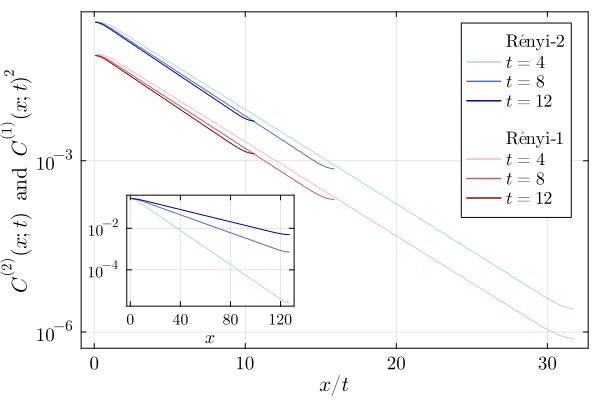

In [ ]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t ÷ 10 + 1

p = 0.1
L = 128
T = 10L

ts = [40, 80, 120]
colors_blue = palette(:blues, length(ts))
colors_red  = palette(:reds,  length(ts))

# inset placement (bottom-left)
BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)

# fonts
main_tickfont  = font("Computer Modern", 12)
inset_tickfont = font("Computer Modern", 10)

# ---------------- main plot ----------------
plt = plot()

# legend headers (dummy entries)
plot!(plt, [NaN], [NaN]; label=L"\textrm{R\'enyi‐2}", linealpha=0)

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )
end

plot!(plt, [NaN], [NaN]; label=L" ", linealpha=0)
plot!(plt, [NaN], [NaN]; label=L"\textrm{R\'enyi‐1}", linealpha=0)

for (i, t) in enumerate(ts)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

plot!(plt;
    xlabel=L"x/t",
    ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=14,
    yguidefontsize=14,
    legendfontsize=12,
)

# ---------------- inset: unscaled R\'enyi-2 ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=12,
    yguidefontsize=12,
    xlabel=L"x",
    # ylabel=L"C^{(2)}(x; t)",
    yscale=:log10,
    xticks = [0,40,80,120],
)

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    x_unscaled = collect(1:2:L)
    y2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, x_unscaled, y2; subplot=2, color=colors_blue[i], label=false)
end

# savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset.pdf")
plt


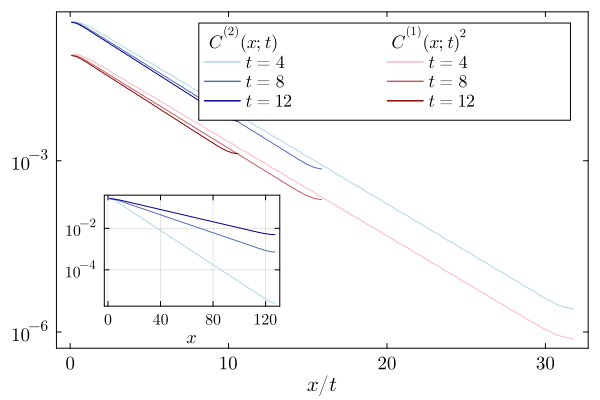

In [109]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t ÷ 10 + 1

p = 0.1
L = 128
T = 10L

ts = [40, 80, 120]
colors_blue = palette(:blues, length(ts))
colors_red  = palette(:reds,  length(ts))

# inset placement (bottom-left)
# BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)
BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)

# fonts
main_tickfont  = font("Computer Modern", 12)
inset_tickfont = font("Computer Modern", 10)

# ---------------- main plot ----------------
plt = plot()

# legend headers (dummy entries)
plot!(plt, [NaN], [NaN]; label="                        ", linealpha=0)
plot!(plt, [NaN], [NaN]; label="                        ", linealpha=0)



for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )

    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

# plot!(plt, [NaN], [NaN]; label=L" ", linealpha=0)


# for (i, t) in enumerate(ts)
#     xs = collect(1:2:L) ./ (p*t)
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
#     plot!(plt, xs, ys;
#         label=L"t=%$(Int(round(p*t,digits=0)))",
#         color=colors_red[i],
#         yscale=:log10,
#     )
# end

plot!(plt;
    xlabel=L"x/t",
    # ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=14,
    yguidefontsize=14,
    legendfontsize=12,
    grid=false,
    legend_columns=2,
    # aspect_ratio=1,
    # n
)


annotate!(plt, 11, 0.135, L"C^{(2)}(x; t)", 12)
annotate!(plt, 22.7, 0.135, L"C^{(1)}(x; t)^2", 12)

# ---------------- inset: unscaled R\'enyi-2 ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=12,
    yguidefontsize=12,
    xlabel=L"x",
    # ylabel=L"C^{(2)}(x; t)",
    yscale=:log10,
    xticks = [0,40,80,120],
)

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    x_unscaled = collect(1:2:L)
    y2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, x_unscaled, y2; subplot=2, color=colors_blue[i], label=false)
end



# savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset_new.pdf")
plt


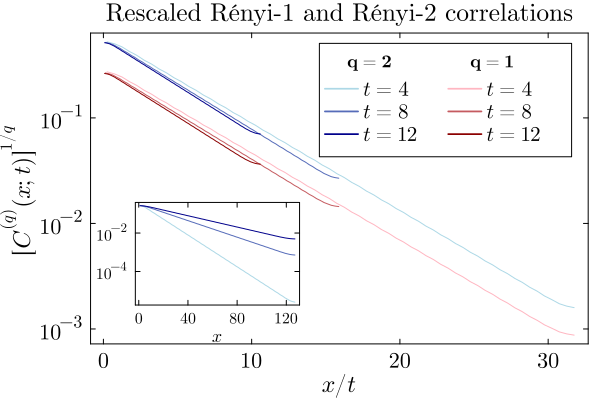

In [179]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t ÷ 10 + 1

p = 0.1
L = 128
T = 10L

ts = [40, 80, 120]
colors_blue = palette(:blues, length(ts))
colors_red  = palette(:reds,  length(ts))

# inset placement (bottom-left)
# BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)
BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)

# fonts
main_tickfont  = font("Computer Modern", 14)
inset_tickfont = font("Computer Modern", 10)

# ---------------- main plot ----------------
plt = plot()

# legend headers (dummy entries)
plot!(plt, [NaN], [NaN]; label="            ", linealpha=0)
plot!(plt, [NaN], [NaN]; label="            ", linealpha=0)



for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])  .^ 0.5
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )

    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

# plot!(plt, [NaN], [NaN]; label=L" ", linealpha=0)


# for (i, t) in enumerate(ts)
#     xs = collect(1:2:L) ./ (p*t)
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
#     plot!(plt, xs, ys;
#         label=L"t=%$(Int(round(p*t,digits=0)))",
#         color=colors_red[i],
#         yscale=:log10,
#     )
# end

plot!(plt;
    xlabel=L"x/t",
    title="Rescaled Rényi‐1 and Rényi‐2 correlations",
    titlefont=font("Computer Modern",16),
    # ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    ylabel=L"[C^{(q)}(x; t)]^{1/q}",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=16,
    yguidefontsize=16,
    legendfontsize=14,
    grid=false,
    legend_columns=2,
    # aspect_ratio=1,
    # n
)


# annotate!(plt, 11.7, 0.37, L"[C^{(2)}(x; t)]^{1/2}", 12)
# annotate!(plt, 22.7, 0.35, L"C^{(1)}(x; t)", 12)

annotate!(plt, 18, 0.33, L"\mathbf{q=2}", 12)
annotate!(plt, 26.3, 0.33, L"\mathbf{q=1}", 12)

# ---------------- inset: unscaled R\'enyi-2 ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=12,
    yguidefontsize=12,
    xlabel=L"x",
    # ylabel=L"C^{(2)}(x; t)",
    yscale=:log10,
    xticks = [0,40,80,120],
)

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    x_unscaled = collect(1:2:L)
    y2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, x_unscaled, y2; subplot=2, color=colors_blue[i], label=false, grid=false)
end



savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset_updated.pdf")
plt


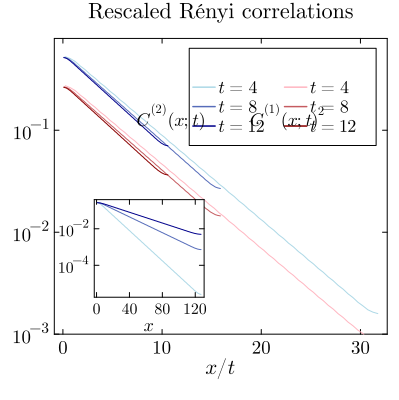

In [110]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t ÷ 10 + 1

p = 0.1
L = 128
T = 10L

ts = [40, 80, 120]
colors_blue = palette(:blues, length(ts))
colors_red  = palette(:reds,  length(ts))

# inset placement (bottom-left)
# BB = bbox(0.09, 0.125, 0.33, 0.33, :bottom, :left)
BB = bbox(0.12, 0.125, 0.33, 0.33, :bottom, :left)

# fonts
main_tickfont  = font("Computer Modern", 12)
inset_tickfont = font("Computer Modern", 10)

# ---------------- main plot ----------------
plt = plot()

# legend headers (dummy entries)
plot!(plt, [NaN], [NaN]; label="           ", linealpha=0)
plot!(plt, [NaN], [NaN]; label="           ", linealpha=0)



for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :]) .^ 0.5
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )

    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    plot!(plt, xs, ys;
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end


plot!(plt;
    xlabel=L"x/t",
    # ylabel=L"C^{(2)}(x; t)\textrm{\ \ and\ \ } C^{(1)}(x; t)^2",
    title="Rescaled Rényi correlations",
    titlefont=font("Computer Modern", 14),
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=14,
    yguidefontsize=14,
    legendfontsize=12,
    grid=false,
    legend_columns=2,
    size=(400,400),
    ylims=(10^(-3), 10^(-0.1)),
    # n
)


annotate!(plt, 11, 0.135, L"C^{(2)}(x; t)", 12)
annotate!(plt, 22.7, 0.135, L"C^{(1)}(x; t)^2", 12)

# ---------------- inset: unscaled R\'enyi-2 ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=12,
    yguidefontsize=12,
    xlabel=L"x",
    # ylabel=L"C^{(2)}(x; t)",
    yscale=:log10,
    xticks = [0,40,80,120],
    grid=:false,
)

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    x_unscaled = collect(1:2:L)
    y2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, x_unscaled, y2; subplot=2, color=colors_blue[i], label=false)
end



# savefig(plt, "../figs/poster/renyi1_TCI_vs_renyi2_with_inset_new.pdf")
plt


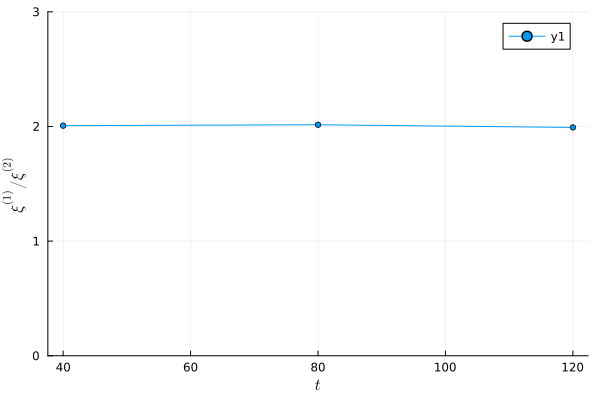

In [26]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

plt = plot()

ts = [40, 80, 120]

data = zeros(length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    xs /= p*t
    xs = xs[L÷8:3L÷8+1]
    X = hcat(xs, ones(length(xs)))

    ys1 = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    ys1 = -log.(ys1)
    ys1 = ys1[L÷8:3L÷8+1]

    β1 = X \ ys1
    a1, b1 = β1


    ys2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    ys2 = -log.(ys2)
    ys2 = ys2[L÷8:3L÷8+1]

    β2 = X \ ys2
    a2, b2 = β2
    
    data[i] = a2/a1
end

plot(ts, data, ylim=(0,3), m=3, xlabel=L"t", ylabel=L"\xi^{(1)}/\xi^{(2)}")


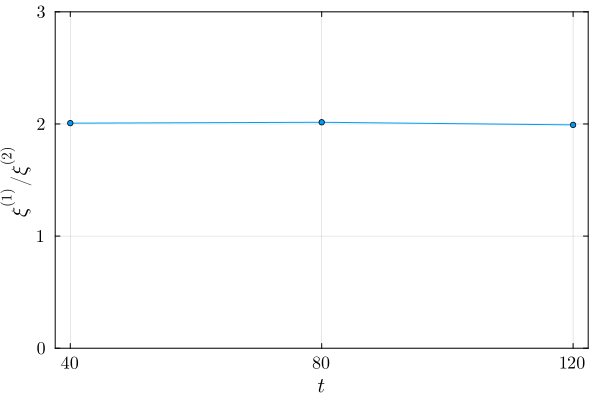

In [29]:
using Plots
using LaTeXStrings
gr()

which_ind(t) = t÷10 + 1

p = 0.1
L = 128
T = 10L

ts = [40, 80, 120]
data = zeros(length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)

    xs = collect(1:2:L) ./ (p*t)          # <- FIX: make a Vector, no mutation
    xs = xs[L÷8:3L÷8+1]
    X  = hcat(xs, ones(length(xs)))

    ys1 = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    ys1 = -log.(ys1)
    ys1 = ys1[L÷8:3L÷8+1]
    a1, b1 = (X \ ys1)

    ys2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    ys2 = -log.(ys2)
    ys2 = ys2[L÷8:3L÷8+1]
    a2, b2 = (X \ ys2)

    data[i] = a2 / a1
end

plt = plot(
    ts, data;
    ylim=(0, 3),
    marker=:circle, markersize=3,
    xlabel=L"t",
    ylabel=L"\xi^{(1)}/\xi^{(2)}",
    frame=:box,
    tickfont=font("Computer Modern", 12),
    xguidefontsize=14,
    yguidefontsize=14,
    legendfontsize=12,
    label=false,
)

# LaTeX tick labels
plot!(plt;
    xticks=(ts, [L"%$t" for t in ts]),
    yticks=(0:1:3, [L"%$y" for y in 0:1:3]),
)

plt


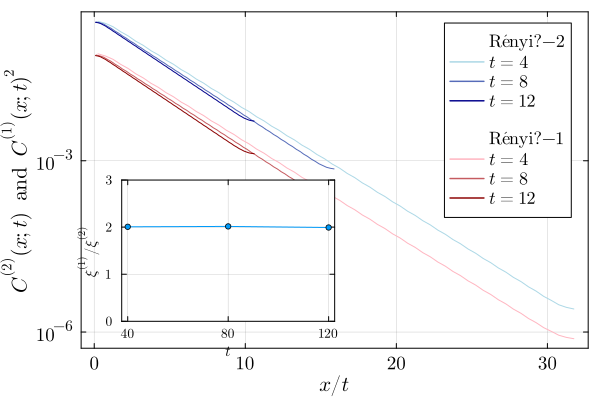

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [33]:
using Plots
using LaTeXStrings
gr()

# ---------------- params ----------------
which_ind(t) = t÷10 + 1

p = 0.1
L = 128
T = 10L

ts_blue = [40, 80, 120]
ts_red  = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red  = palette(:reds,  length(ts_red))

# inset placement (bottom-left)
BB = bbox(0.08, 0.08, 0.42, 0.42, :bottom, :left)

# main vs inset typography
main_tickfont = font("Computer Modern", 12)
main_guide_fs = 14
main_leg_fs   = 12

inset_tickfont = font("Computer Modern", 9)
inset_guide_fs = 10

# ---------------- main plot (subplot 1) ----------------
plt = plot()

# legend headers (dummy entries)
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi\text{-}2}", linealpha=0)

for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_blue[i],
        yscale=:log10,
    )
end

plot!(plt, [NaN], [NaN]; subplot=1, label=L" ", linealpha=0)
plot!(plt, [NaN], [NaN]; subplot=1, label=L"\textrm{R\'enyi\text{-}1}", linealpha=0)

for (i, t) in enumerate(ts_red)
    ind = which_ind(t)
    xs = collect(1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]).^2
    plot!(plt, xs, ys;
        subplot=1,
        label=L"t=%$(Int(round(p*t,digits=0)))",
        color=colors_red[i],
        yscale=:log10,
    )
end

plot!(plt;
    subplot=1,
    xlabel=L"x/t",
    ylabel=L"C^{(2)}(x;t)\ \ \textrm{and}\ \ C^{(1)}(x;t)^2",
    frame=:box,
    legend=:topright,
    tickfont=main_tickfont,
    xguidefontsize=main_guide_fs,
    yguidefontsize=main_guide_fs,
    legendfontsize=main_leg_fs,
)

# ---------------- inset plot (subplot 2) ----------------
# compute ratio data
ts = [40, 80, 120]
ratio = zeros(length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)

    xs = collect(1:2:L) ./ (p*t)
    xs = xs[L÷8:3L÷8+1]
    X  = hcat(xs, ones(length(xs)))

    ys1 = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:])
    ys1 = (-log.(ys1))[L÷8:3L÷8+1]
    a1, _ = (X \ ys1)

    ys2 = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    ys2 = (-log.(ys2))[L÷8:3L÷8+1]
    a2, _ = (X \ ys2)

    ratio[i] = a2 / a1
end

# create empty inset once
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    tickfont=inset_tickfont,
    xguidefontsize=inset_guide_fs,
    yguidefontsize=inset_guide_fs,
    xlabel=L"t",
    ylabel=L"\xi^{(1)}/\xi^{(2)}",
    ylim=(0, 3),
)

# draw inset data
plot!(plt, ts, ratio;
    subplot=2,
    label=false,
    marker=:circle,
    markersize=3,
    xticks=(ts, [L"%$t" for t in ts]),
    yticks=(0:1:3, [L"%$y" for y in 0:1:3]),
)

# savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2_with_inset.pdf")
plt


In [7]:
xs = 1:10
ys = 1 .- 2xs
X = hcat(xs, ones(length(xs)))
β = X \ ys
a, b = β

2-element Vector{Float64}:
 -2.0
  1.0000000000000044

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

Ls = [128]
# Ls = [512]

plt = plot()
for L in Ls
    T = 10L
    # ts = union(L÷4:10:L,   L:L:6L)
    ts = 100:100:10L

    ms2 = zeros(length(ts))

    # plt = plot()
    for (i, t) in enumerate(ts)
        ind = which_ind(t)
        xs = collect(1:2:L)
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
        ys = -log.(abs.(ys))

        xs = xs[L÷8:2L÷8]
        ys = ys[L÷8:2L÷8]

        X = hcat(xs, ones(length(xs)))
        β = X \ ys
        a, b = β

        ms2[i] = a

        # plot!(plt, xs, ys, label="t=$(round(p*t,digits=2))", m=2)
    end

    plot!(plt, p*ts/L, (1 ./ ms) / L, label="L=$L", m=2)

    # X = hcat(ts, ones(length(ts)))
    # β = X \ ms
    # a, b = β


    # plot!(plt, ts/L, (a*ts .+ b)/L, label="fit L=$L", l=:dash)

end

plt

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = [40, 80, 120]
ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐2}", linealpha = 0)
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end

# plot!(plt, [NaN], [NaN]; label = L" ", linealpha = 0)
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐1}", linealpha = 0)

# for (i, t) in enumerate(ts_red)
#     ind = which_ind(t)
#     xs = 1:2:L
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]) .^ 2
#     xs /= p*t

#     plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_red[i], yscale=:log10)
# end

plot!(plt, xlabel=L"x/t", ylabel=L"C_2(x; t)\textrm{\ \ and\ \ } C_1(x; t)^2", frame=:box, tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

# savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2.pdf")

plt


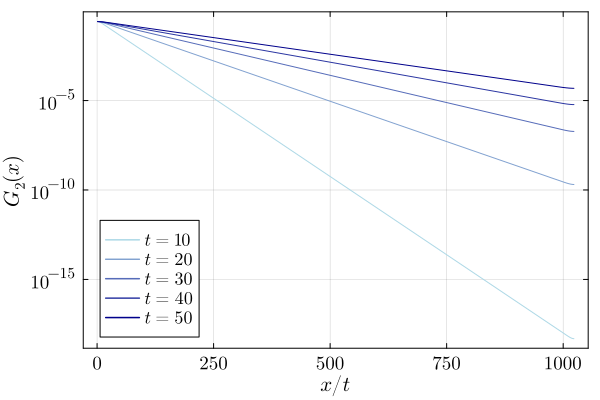

In [42]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = 100:100:500
# ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐2}", linealpha = 0)
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    # xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end

# plot!(plt, [NaN], [NaN]; label = L" ", linealpha = 0)
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐1}", linealpha = 0)

# for (i, t) in enumerate(ts_red)
#     ind = which_ind(t)
#     xs = 1:2:L
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]) .^ 2
#     xs /= p*t

#     plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_red[i], yscale=:log10)
# end

plot!(plt, xlabel=L"x/t", ylabel=L"G_2(x)", frame=:box, legend=:bottomleft,
tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

# savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2.pdf")

plt


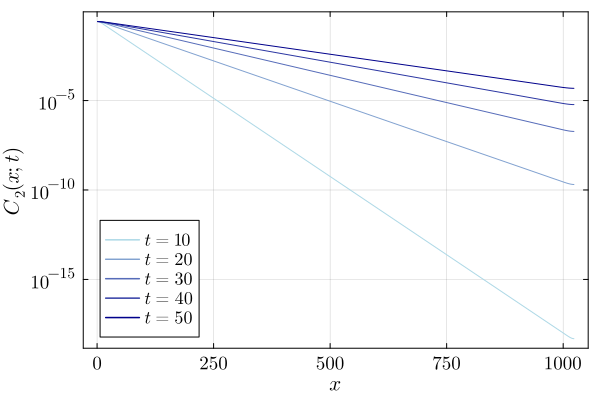

In [87]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = 100:100:500
# ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐2}", linealpha = 0)
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    # xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end

# plot!(plt, [NaN], [NaN]; label = L" ", linealpha = 0)
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐1}", linealpha = 0)

# for (i, t) in enumerate(ts_red)
#     ind = which_ind(t)
#     xs = 1:2:L
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]) .^ 2
#     xs /= p*t

#     plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_red[i], yscale=:log10)
# end

plot!(plt, xlabel=L"x", ylabel=L"C_2(x;t)", frame=:box, legend=:bottomleft,
tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

savefig(plt, "../figs/26_01_09/renyi2_unscaled.pdf")

plt


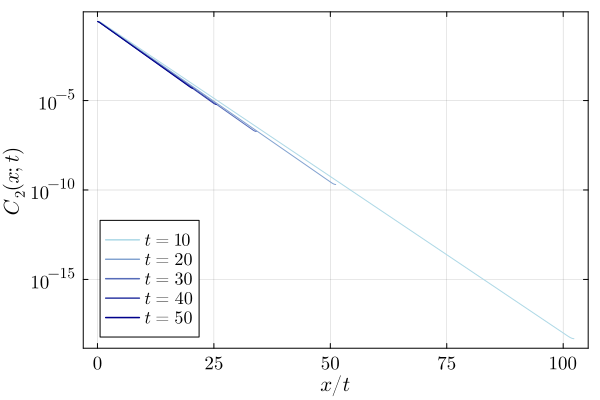

In [88]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = 100:100:500
# ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐2}", linealpha = 0)
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end

# plot!(plt, [NaN], [NaN]; label = L" ", linealpha = 0)
# plot!(plt, [NaN], [NaN]; label = L"\textrm{R\'enyi‐1}", linealpha = 0)

# for (i, t) in enumerate(ts_red)
#     ind = which_ind(t)
#     xs = 1:2:L
#     ys = reverse(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI][:]) .^ 2
#     xs /= p*t

#     plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_red[i], yscale=:log10)
# end

plot!(plt, xlabel=L"x/t", ylabel=L"C_2(x;t)", frame=:box, legend=:bottomleft,
tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

savefig(plt, "../figs/26_01_09/renyi2_scaled.pdf")

plt


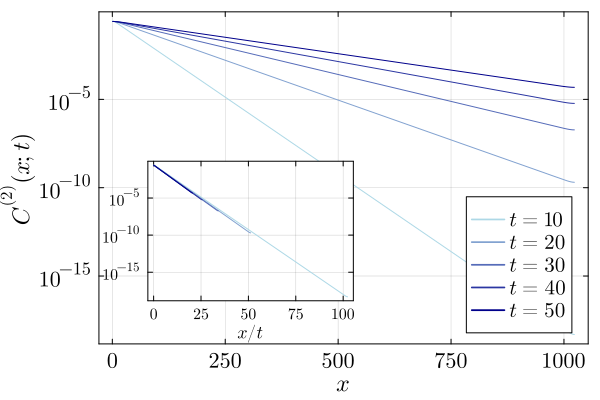

In [30]:
using Plots
gr()

# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1
L = 1024
T = 10L

ts_blue = 100:100:500
colors_blue = palette(:blues, length(ts_blue))

yticks = nothing  # log plot; keep default unless you want explicit ticks

BB = bbox(0.1, 0.13, 0.42, 0.42, :bottom, :left)  # inset box

plt = plot()

# ---------------- main (subplot 1): unscaled x ----------------
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        subplot=1,
        color=colors_blue[i],
        label=L"t=%$(Int(round(p*t,digits=0)))",
        yscale=:log10,
    )
end

plot!(plt;
    subplot=1,
    xlabel=L"x",
    ylabel=L"C^{(2)}(x;t)",
    frame=:box,
    legend=:bottomright,
    tickfont=font("Computer Modern", 14),
    xguidefontsize=16,
    yguidefontsize=16,
    legendfontsize=14,
)

# ---------------- create empty inset (subplot 2) ONCE ----------------
plot!(plt;
    inset=(1, BB), subplot=2,
    frame=:box,
    legend=false,
    yscale=:log10,
    tickfont=font("Computer Modern", 10),
    xguidefontsize=12,
    yguidefontsize=12,
    xlabel=L"x/t",
    # ylabel=L"C_2(x;t)",
)

# ---------------- inset data (subplot 2): scaled x/(p t) ----------------
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = (1:2:L) ./ (p*t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    plot!(plt, xs, ys;
        subplot=2,
        color=colors_blue[i],
        label=false,
    )
end

savefig(plt, "../figs/poster/renyi2_unscaled_with_inset.pdf")
plt


┌ Warning: No strict ticks found
└ @ PlotUtils /Users/jhauser/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/jhauser/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: Invalid negative or zero value -2.5139030227229765e-29 found at series index 97 for log10 based yscale
└ @ Plots /Users/jhauser/.julia/packages/Plots/8ZnR3/src/utils.jl:105
┌ Warning: Invalid negative or zero value -1.6344532158677736e-29 found at series index 204 for log10 based yscale
└ @ Plots /Users/jhauser/.julia/packages/Plots/8ZnR3/src/utils.jl:105
┌ Warning: Invalid negative or zero value -6.11322507474565e-30 found at series index 274 for log10 based yscale
└ @ Plots /Users/jhauser/.julia/packages/Plots/8ZnR3/src/utils.jl:105
┌ Warning: Invalid negative or zero value -7.847996701797386e-29 found at series index 334 for log10 based yscale
└ @ Plots /Users/jhauser/.julia/packages/Plots/8ZnR3/src/utils.jl:105
┌ Warning: Invalid negative or zero value 

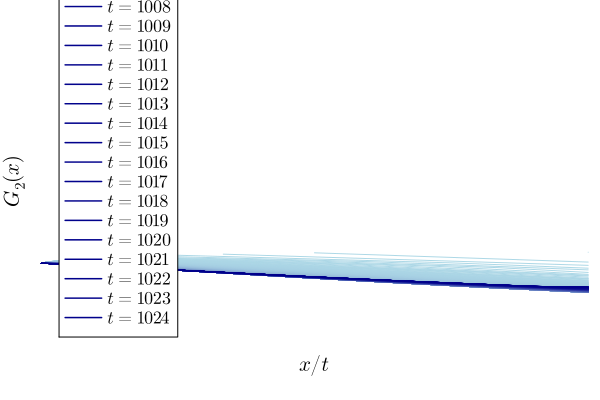

In [89]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = 10:10:10L
# ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))


# --- legend column headers (dummy entries) ---
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])

    

    xs /= p*t
    
    plot!(plt, xs, ys, label=L"t=%$(Int(round(p*t,digits=0)))", color=colors_blue[i], yscale=:log10)
end



plot!(plt, xlabel=L"x/t", ylabel=L"G_2(x)", frame=:box, legend=:bottomleft,
tickfont=font("Computer Modern", 12), xguidefontsize = 14, yguidefontsize = 14, legendfontsize = 12)

# savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2.pdf")

plt


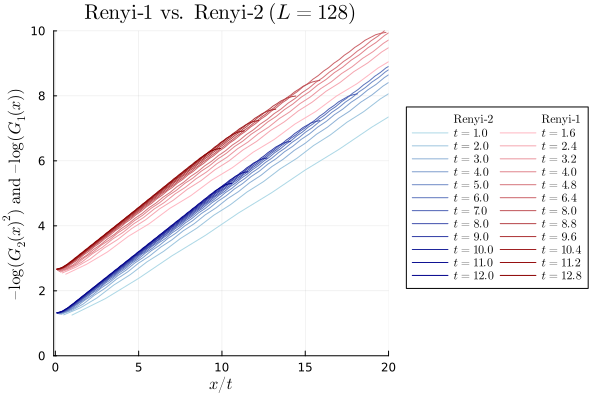

In [338]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot(legend=:outerright, legend_columns=2)
# Interleave blues and reds for proper column grouping
ts_blue = union(10:10:L)#, 2L:L:10L)
ts_red = [16, 24, 32, 40, 48, 64, 80, 88, 96, 104, 112, 128]#union(10:10:L)#, 2L:L:8L)

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))

max_len = max(length(ts_blue), length(ts_red))

# --- legend column headers (dummy entries) ---
plot!(plt, [NaN], [NaN]; label = L"\textrm{Renyi‐2}", linealpha = 0)
plot!(plt, [NaN], [NaN]; label = L"\textrm{Renyi‐1}", linealpha = 0)

for i in 1:max_len
    # Add blue entry (left column)
    if i <= length(ts_blue)
        t = ts_blue[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label=L"t=%$(round(p*t,digits=2))", color=colors_blue[i])#, xlim=(-0.1,20), ylim=(0,10))
    end
    
    # Add red entry (right column)
    if i <= length(ts_red)
        t = ts_red[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:]) .^ 2
        xs /= p*t
        ys = -log.(ys) #.- 1.3
        plot!(plt, xs[1:end], ys[1:end], label=L"t=%$(round(p*t,digits=2))", color=colors_red[i], xlim=(-0.1,20), ylim=(0,10))
    end
end

plot!(plt, xlabel=L"x/t", ylabel=L"\endash\log(G_2(x)^2)\textrm{\ and\ } \endash\log(G_1(x))", title=L"\textrm{Renyi‐1\ vs.\ Renyi‐2\ } (L = 128)")

savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2_L128.pdf")

plt


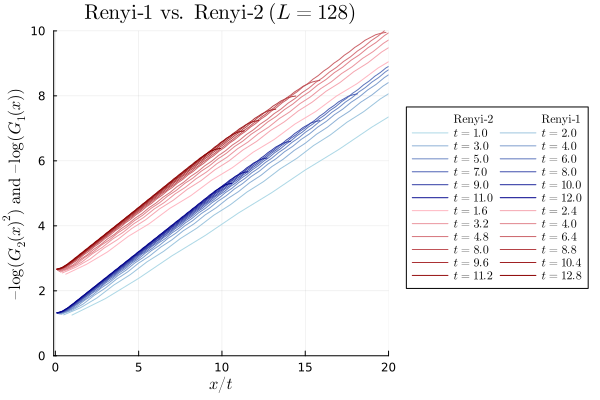

In [337]:
which_ind(t) = t ÷ 10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

plt = plot(legend = :outerright, legend_columns = 2)

# Two groups (left column = blues, right column = reds)
ts_blue = union(10:10:L)
ts_red  = [16, 24, 32, 40, 48, 64, 80, 88, 96, 104, 112, 128]

colors_blue = palette(:blues, length(ts_blue))
colors_red  = palette(:reds,  length(ts_red))

# --- legend column headers (dummy entries) ---
plot!(plt, [NaN], [NaN]; label = L"\textrm{Renyi‐2}", linealpha = 0)
plot!(plt, [NaN], [NaN]; label = L"\textrm{Renyi‐1}", linealpha = 0)

# --- blue column (Renyi-2) ---
for (i, t) in enumerate(ts_blue)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])

    xs = xs ./ (p*t)
    ys = -log.(ys)

    plot!(plt, xs, ys;
        label = L"t=%$(round(p*t, digits=2))",
        color = colors_blue[i],
    )
end

# --- red column (Renyi-1) ---
for (i, t) in enumerate(ts_red)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(mean(
        combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI],
        dims = 1
    )[1, :]).^2

    xs = xs ./ (p*t)
    ys = -log.(ys)

    plot!(plt, xs, ys;
        label = L"t=%$(round(p*t, digits=2))",
        color = colors_red[i],
        xlim = (-0.1, 20),
        ylim = (0, 10),
    )
end

plot!(plt,
    xlabel = L"x/t",
    ylabel = L"\endash\log(G_2(x)^2)\textrm{\ and\ } \endash\log(G_1(x))",
    title  = L"\textrm{Renyi‐1\ vs.\ Renyi‐2\ } (L = 128)",
)

savefig(plt, "../figs/26_01_09/renyi1_TCI_vs_renyi2_L128.pdf")

plt


In [240]:
L = 64
T = 10L
p = 0.1
ind = 2
reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

32-element Vector{Float64}:
 0.2854489854781155
 0.17217503097900605
 0.09220312897956143
 0.04608186508092105
 0.024611677046670118
 0.012304181034875693
 0.006571829750822867
 0.0032854873159483384
 0.001754820751371282
 0.0008772960555247419
 ⋮
 8.491098626814414e-8
 4.533320658165808e-8
 2.270305374943064e-8
 1.2091439668553832e-8
 6.0494707924272265e-9
 3.2693331729523724e-9
 1.5670065555666353e-9
 8.918918784835379e-10
 5.776700952166314e-10

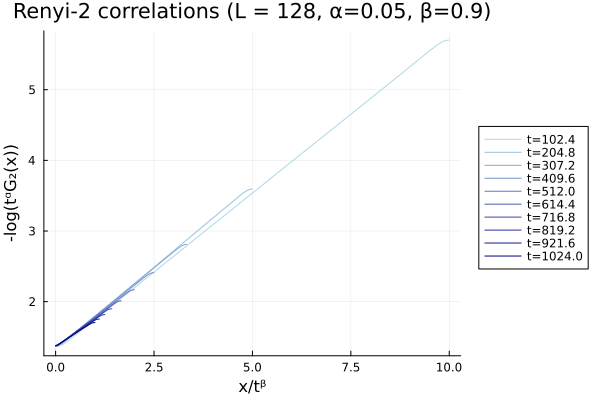

In [247]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = union(L:L:10L)

α = 0.0
β = 1.0

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^β
    ys = -log.((p*t)^α * ys)
    # ys .-= ys[1]

    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/tᵝ", ylabel="-log(tᵅG₂(x))", title="Renyi-2 correlations (L = 128, α=0.05, β=0.9)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled.pdf")

plt

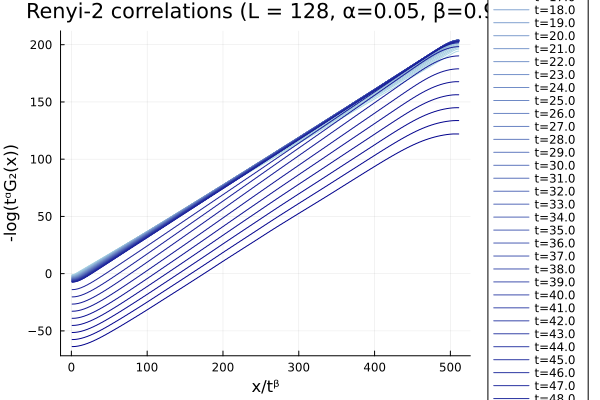

In [132]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 512
T = 10L

ts = union(50:10:L, 2L:L:10L)

α = 0.0
β = 1.0

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    # xs /= (p*t)^β
    ys = -(p*t)^β * (log.((p*t)^α * ys) .+ 1.5)

    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/tᵝ", ylabel="-log(tᵅG₂(x))", title="Renyi-2 correlations (L = 128, α=0.05, β=0.9)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled.pdf")

plt

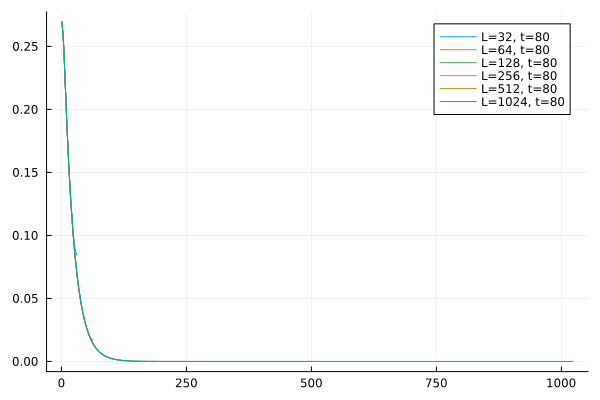

In [205]:
plt = plot()

for L in [32, 64, 128, 256, 512, 1024]
    T = 10L
    ts = [80]

    for t in ts
        ind = which_ind(t)
        xs = 1:2:L
        if L == 1024
            ind += 1
        end
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

        plot!(plt, xs, ys, label="L=$L, t=$t")
    end
end
plt

In [197]:
L = 1024
T = 10L
p = 0.1
ind = 7
reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

512-element Vector{Float64}:
  0.273768119075551
  0.257588644823351
  0.2337151025787581
  0.20035946627994583
  0.17530302320766106
  0.14800769131712727
  0.12923724303368372
  0.1091555036949189
  0.09535234518956108
  0.08055342054006205
  ⋮
 -2.8698682563053973e-28
 -4.515350241046469e-28
 -1.3402759337411202e-28
  3.2585940203793225e-29
  3.9519422290998223e-28
 -2.66315789318291e-28
 -3.506287767090908e-28
 -2.866467972647865e-28
 -1.5030705591912719e-28

In [196]:
L = 512
T = 10L
p = 0.1
ind = 6
reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

256-element Vector{Float64}:
 0.2739789548223473
 0.2573436446519823
 0.2328959218751409
 0.19896305739662246
 0.17361505815131234
 0.1461173574416182
 0.12726567039222772
 0.10715477556115029
 0.09336842943616008
 0.07863009838052255
 ⋮
 7.937949688773082e-18
 6.912989273336895e-18
 5.813911385628424e-18
 5.063483879811312e-18
 4.277519323530159e-18
 3.771112303992616e-18
 3.2994433331349166e-18
 3.0547470305398153e-18
 2.908004837330762e-18

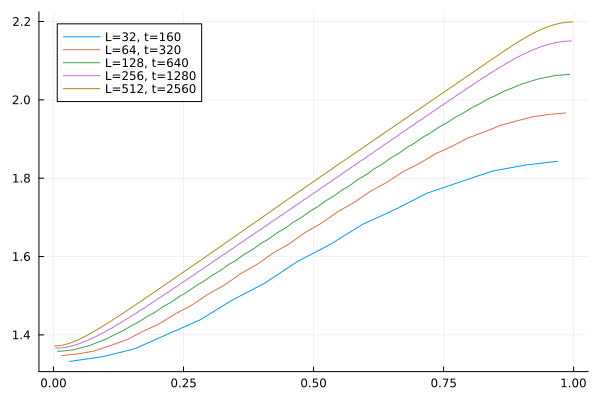

In [175]:
plt = plot()

for L in [32, 64, 128, 256, 512]
    T = 10L
    ts = union(5L)

    for (ind, t) in enumerate(ts)
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

        plot!(plt, xs/L, -log.(ys), label="L=$L, t=$t")
    end
end
plt

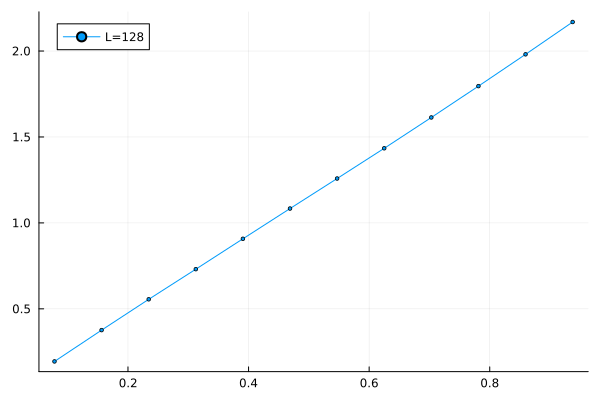

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

Ls = [128]
# Ls = [512]

plt = plot()
for L in Ls
    T = 10L
    # ts = union(L÷4:10:L,   L:L:6L)
    ts = 100:100:10L

    ms2 = zeros(length(ts))

    # plt = plot()
    for (i, t) in enumerate(ts)
        ind = which_ind(t)
        xs = collect(1:2:L)
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
        ys = -log.(abs.(ys))

        xs = xs[L÷8:2L÷8]
        ys = ys[L÷8:2L÷8]

        X = hcat(xs, ones(length(xs)))
        β = X \ ys
        a, b = β

        ms2[i] = a

        # plot!(plt, xs, ys, label="t=$(round(p*t,digits=2))", m=2)
    end

    plot!(plt, p*ts/L, (1 ./ ms) / L, label="L=$L", m=2)

    # X = hcat(ts, ones(length(ts)))
    # β = X \ ms
    # a, b = β


    # plot!(plt, ts/L, (a*ts .+ b)/L, label="fit L=$L", l=:dash)

end

plt

In [112]:
xs = [1,2, 3, 4]
ys = 3xs

X = hcat(xs, ones(length(xs)))
β = X \ ys
a, b = β

2-element Vector{Float64}:
  3.0000000000000004
 -1.2882841327868513e-15

In [48]:
a

3.0000000000000004